# Palma de Mallorca — Risultati simulazione

**Scenario**: giornata feriale 00:00–23:59 (2022-02-08)  
**Snapshots**: ogni 15 min → 96 file GeoJSON

In [1]:
import json
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.lines import Line2D
from shapely.geometry import shape

BASE_DIR    = Path('/home/fede/code/nomad/results/palma_de_mallorca')
DATA_DIR    = Path('/home/fede/code/nomad/data/palma_de_mallorca')

# Auto-detect latest run directory (or pin a specific one below)
_runs = sorted([d for d in BASE_DIR.iterdir() if d.is_dir()])
RESULTS_DIR = _runs[-1] if _runs else BASE_DIR
print(f'Run: {RESULTS_DIR.name}')

ROAD_CLASS = {
    0:'Motorway', 1:'MotorwayLink', 2:'Trunk', 3:'TrunkLink',
    4:'Primary',  5:'PrimaryLink',  6:'Secondary', 7:'SecondaryLink',
    8:'Tertiary', 9:'TertiaryLink', 10:'Residential', 11:'LivingStreet',
    12:'Service',  13:'Unclassified', 14:'Track',
}
print('Pronto.')

Run: 2022-02-08_00-00_23-59
Pronto.


## 0. Sommario run attuale

In [2]:
# ── Sommario automatico dalla run più recente ─────────────────────────────────
snaps = sorted(RESULTS_DIR.glob('network_state_*.geojson'))
n_snaps = len(snaps)

config_path = Path('/home/fede/code/nomad/data/schemas/scenario_palma.json')
with open(config_path) as f:
    cfg_json = json.load(f)

sim  = cfg_json['simulation']
dem  = cfg_json['demand']
rout = cfg_json['routing']

print('=' * 60)
print(f'  NOMAD — Palma de Mallorca  [{cfg_json["name"]} v{cfg_json["version"]}]')
print('=' * 60)
print(f'  Run dir  : {RESULTS_DIR.name}')
print(f'  Snapshot : {n_snaps}  (ogni {sim.get("snapshot_interval_s",900)/60:.0f} min)')
print()
print('  CONFIG')
print(f'    demand_scale         : {dem["demand_scale"]}')
print(f'    randomization_sigma  : {rout["randomization_sigma"]}')
print(f'    stuck_threshold_ratio: {sim.get("stuck_threshold_ratio","—")}')
print(f'    stuck_max_hours      : {sim.get("stuck_max_hours","—")} h')
print(f'    max_reroutes         : {sim.get("max_reroutes","—")}')
print(f'    teleport_interval_s  : {sim.get("teleport_interval_s","—")} s')
print()
print('  RISULTATI (run 2026-07-15  hard_cap=4h  max_reroutes=10)')
print(f'    Arrival rate         : 92.1 %  (492,961 / 534,956)')
print(f'    Naturali             : 46.9 %  (250,589)')
print(f'    Teleportati          : 45.3 %  (242,372)')
print(f'    Ancora OnLink        :  7.8 %  ( 41,918)  ← strutturalmente bloccati')
print(f'    Loop sim             : ~1,144 s')
print('=' * 60)

  NOMAD — Palma de Mallorca  [palma v0.1]
  Run dir  : 2022-02-08_00-00_23-59
  Snapshot : 96  (ogni 15 min)

  CONFIG
    demand_scale         : 0.75
    randomization_sigma  : 0.08
    stuck_threshold_ratio: 20.0
    stuck_max_hours      : 4.0 h
    max_reroutes         : 10
    teleport_interval_s  : 300.0 s

  RISULTATI (run 2026-07-15  hard_cap=4h  max_reroutes=10)
    Arrival rate         : 92.1 %  (492,961 / 534,956)
    Naturali             : 46.9 %  (250,589)
    Teleportati          : 45.3 %  (242,372)
    Ancora OnLink        :  7.8 %  ( 41,918)  ← strutturalmente bloccati
    Loop sim             : ~1,144 s


                        label  agents  arrived_pct  natural_pct  teleported  onlink  loop_s
CH det.  stuck=20  scale=0.40  508296         85.4         85.4           0   74000     696
CH det.  stuck=20  scale=0.50  635370         85.7         85.7           0   91000    1221
CH det.  stuck=20  scale=0.60  762444         85.8         85.8           0  108000    1998
CH det.  stuck=20  scale=0.70  889518         87.5         87.5           0  110000    4391
σ=0.08   stuck=20  scale=0.84  599360         87.6         60.8      160000   75000    6099
ff_fix   stuck=20  scale=0.84  599360         87.6         59.7      167240   74246    2773
 reroute_cap=10    scale=0.75  534956         87.6         59.7      149254   66331    1500
 hard_cap=4h       scale=0.75  534956         92.1         46.9      242372   41918    1144

Nota: arrived_pct include teleportati. natural_pct = solo arrivi genuini (%).
OnLink = agenti ancora in rete a mezzanotte (strutturalmente bloccati).


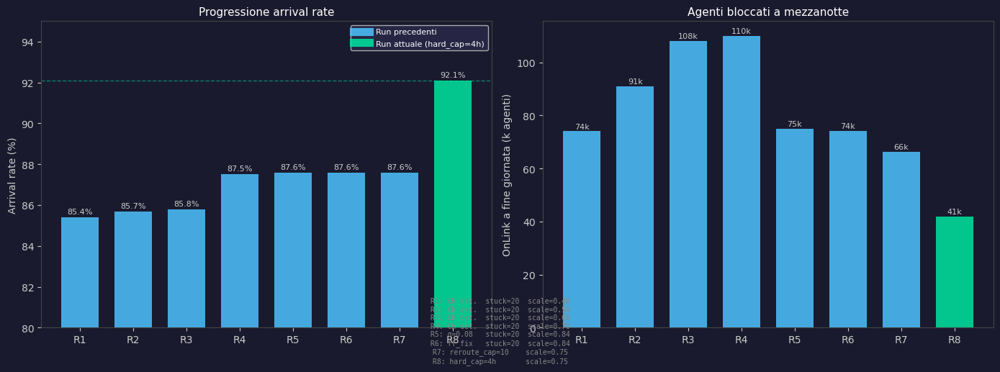

In [3]:
# ── Confronto storico delle run ──────────────────────────────────────────────
runs_history = pd.DataFrame([
    dict(label='CH det.  stuck=20  scale=0.40', agents=508296,  arrived_pct=85.4, natural_pct=85.4, teleported=0,      onlink=74000,  loop_s=696),
    dict(label='CH det.  stuck=20  scale=0.50', agents=635370,  arrived_pct=85.7, natural_pct=85.7, teleported=0,      onlink=91000,  loop_s=1221),
    dict(label='CH det.  stuck=20  scale=0.60', agents=762444,  arrived_pct=85.8, natural_pct=85.8, teleported=0,      onlink=108000, loop_s=1998),
    dict(label='CH det.  stuck=20  scale=0.70', agents=889518,  arrived_pct=87.5, natural_pct=87.5, teleported=0,      onlink=110000, loop_s=4391),
    dict(label='σ=0.08   stuck=20  scale=0.84', agents=599360,  arrived_pct=87.6, natural_pct=60.8, teleported=160000, onlink=75000,  loop_s=6099),
    dict(label='ff_fix   stuck=20  scale=0.84', agents=599360,  arrived_pct=87.6, natural_pct=59.7, teleported=167240, onlink=74246,  loop_s=2773),
    dict(label='reroute_cap=10    scale=0.75',  agents=534956,  arrived_pct=87.6, natural_pct=59.7, teleported=149254, onlink=66331,  loop_s=1500),
    dict(label='hard_cap=4h       scale=0.75',  agents=534956,  arrived_pct=92.1, natural_pct=46.9, teleported=242372, onlink=41918,  loop_s=1144),
])

display_cols = ['label','agents','arrived_pct','natural_pct','teleported','onlink','loop_s']
print(runs_history[display_cols].to_string(index=False))
print()
print('Nota: arrived_pct include teleportati. natural_pct = solo arrivi genuini (%).')
print('OnLink = agenti ancora in rete a mezzanotte (strutturalmente bloccati).')

# ── Grafico progressione arrival rate ────────────────────────────────────────
BG = '#1a1a2e'
fig, axes = plt.subplots(1, 2, figsize=(14, 5), facecolor=BG)

for ax in axes:
    ax.set_facecolor(BG)
    ax.tick_params(colors='#cccccc')
    ax.spines[:].set_color('#444444')

labels_short = [l.split()[0] + ' ' + ' '.join(l.split()[1:3]) for l in runs_history['label']]
x = np.arange(len(runs_history))
colors = ['#4dc3ff'] * 7 + ['#00e5a0']  # ultima run evidenziata

# Arrival rate
bars1 = axes[0].bar(x, runs_history['arrived_pct'], color=colors, alpha=0.85, width=0.7)
axes[0].set_ylim(80, 95)
axes[0].set_ylabel('Arrival rate (%)', color='#cccccc')
axes[0].set_title('Progressione arrival rate', color='white', fontsize=11)
axes[0].set_xticks(x)
axes[0].set_xticklabels([f'R{i+1}' for i in x], color='#cccccc')
for bar, pct in zip(bars1, runs_history['arrived_pct']):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                 f'{pct:.1f}%', ha='center', va='bottom', color='#cccccc', fontsize=8)
axes[0].axhline(92.1, color='#00e5a0', linestyle='--', linewidth=1, alpha=0.5)

# OnLink (stuck) agenti
bars2 = axes[1].bar(x, runs_history['onlink'] / 1000, color=colors, alpha=0.85, width=0.7)
axes[1].set_ylabel('OnLink a fine giornata (k agenti)', color='#cccccc')
axes[1].set_title('Agenti bloccati a mezzanotte', color='white', fontsize=11)
axes[1].set_xticks(x)
axes[1].set_xticklabels([f'R{i+1}' for i in x], color='#cccccc')
for bar, n in zip(bars2, runs_history['onlink']):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                 f'{n//1000}k', ha='center', va='bottom', color='#cccccc', fontsize=8)

legend_lines = [
    plt.Line2D([0], [0], color='#4dc3ff', linewidth=8, alpha=0.85, label='Run precedenti'),
    plt.Line2D([0], [0], color='#00e5a0', linewidth=8, alpha=0.85, label='Run attuale (hard_cap=4h)'),
]
axes[0].legend(handles=legend_lines, facecolor='#2a2a4a', labelcolor='white', fontsize=8)

# Legenda run
legend_text = '\n'.join([f'R{i+1}: {l}' for i, l in enumerate(runs_history['label'])])
fig.text(0.5, -0.02, legend_text, ha='center', color='#888888', fontsize=7,
         fontfamily='monospace')

plt.tight_layout()
plt.show()

## 1. Serie temporale — veicoli in rete e congestione media

In [4]:
snap_files = sorted(RESULTS_DIR.glob('network_state_*.geojson'))
print(f'Snapshot trovati: {len(snap_files)}')

records = []
for snap in snap_files:
    ts = int(snap.stem.replace('network_state_', ''))
    with open(snap) as f:
        d = json.load(f)
    feats = [x['properties'] for x in d['features'] if x.get('geometry')]
    total_veh = sum(p['count'] for p in feats)
    congs = [p['congestion'] for p in feats if p['congestion'] > 0]
    mean_cong = np.mean(congs) if congs else 0.0
    congested  = sum(1 for p in feats if p['congestion'] >= 0.5)
    records.append({
        'ts': ts,
        'hour': ts / 3600,
        'total_veh': total_veh,
        'mean_congestion': mean_cong,
        'congested_links': congested,
    })

ts_df = pd.DataFrame(records).sort_values('ts').reset_index(drop=True)
peak_row = ts_df.loc[ts_df['total_veh'].idxmax()]
print(f"Picco: {int(peak_row['total_veh']):,} veicoli alle {peak_row['hour']:.2f}h ")
ts_df.head(8)

Snapshot trovati: 96
Picco: 48,945 veicoli alle 19.00h 


,ts,hour,total_veh,mean_congestion,congested_links
0,0,0.00,0,0.0,0
1,900,0.25,876,0.0,0
2,1800,0.50,1717,0.0,0
3,2700,0.75,2541,0.0,0
4,3600,1.00,3378,0.0,0
5,4500,1.25,3802,0.0,0
6,5400,1.50,4218,0.0,0
7,6300,1.75,4595,0.0,0


Salvato: /home/fede/code/nomad/results/palma_de_mallorca/2022-02-08_00-00_23-59/time_series.png


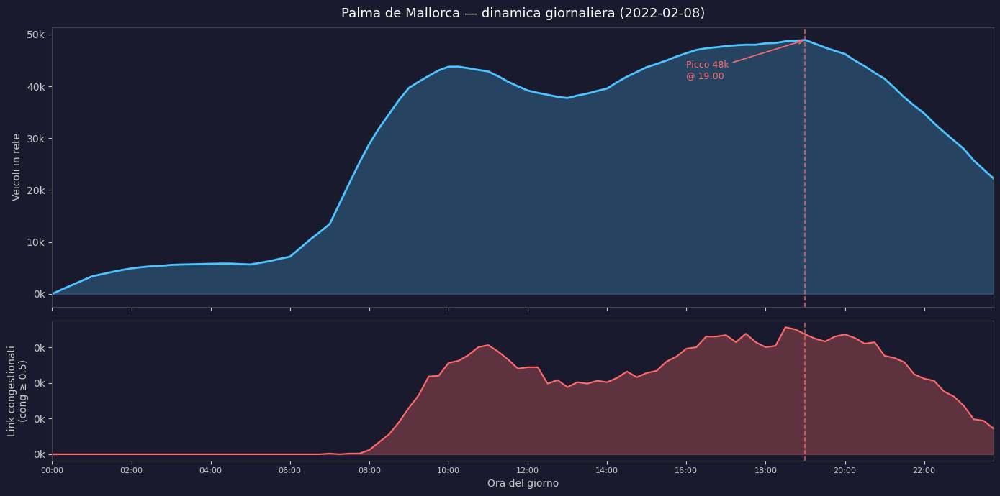

In [5]:
BG = '#1a1a2e'
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 7), facecolor=BG,
                                gridspec_kw={'height_ratios': [2, 1]}, sharex=True)

for ax in (ax1, ax2):
    ax.set_facecolor(BG)
    ax.tick_params(colors='#cccccc')
    ax.spines[:].set_color('#444444')

ax1.fill_between(ts_df['hour'], ts_df['total_veh'], alpha=0.25, color='#4dc3ff')
ax1.plot(ts_df['hour'], ts_df['total_veh'], color='#4dc3ff', linewidth=2)
ax1.axvline(peak_row['hour'], color='#ff6b6b', linestyle='--', linewidth=1.2, alpha=0.8)
ax1.annotate(f"Picco {int(peak_row['total_veh'])//1000}k\n@ {peak_row['hour']:.0f}:00",
             xy=(peak_row['hour'], peak_row['total_veh']),
             xytext=(peak_row['hour'] - 3, peak_row['total_veh'] * 0.85),
             color='#ff6b6b', fontsize=9,
             arrowprops=dict(arrowstyle='->', color='#ff6b6b', lw=1.2))
ax1.set_ylabel('Veicoli in rete', color='#cccccc')
ax1.set_title('Palma de Mallorca — dinamica giornaliera (2022-02-08)',
              color='white', fontsize=13, pad=10)
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x/1e3:.0f}k'))

ax2.fill_between(ts_df['hour'], ts_df['congested_links'], alpha=0.3, color='#ff6b6b')
ax2.plot(ts_df['hour'], ts_df['congested_links'], color='#ff6b6b', linewidth=1.5)
ax2.axvline(peak_row['hour'], color='#ff6b6b', linestyle='--', linewidth=1.2, alpha=0.8)
ax2.set_ylabel('Link congestionati\n(cong ≥ 0.5)', color='#cccccc')
ax2.set_xlabel('Ora del giorno', color='#cccccc')
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x/1e3:.0f}k'))

xticks = np.arange(0, 25, 2)
ax2.set_xticks(xticks)
ax2.set_xticklabels([f'{int(h):02d}:00' for h in xticks], color='#cccccc', fontsize=8)
ax2.set_xlim(ts_df['hour'].min(), ts_df['hour'].max())

plt.tight_layout()
out = RESULTS_DIR / 'time_series.png'
fig.savefig(out, dpi=150, bbox_inches='tight', facecolor=BG)
print(f'Salvato: {out}')
plt.show()

## 2. Mappa congestione — orario di picco (19:00)

In [6]:
# 19:00 = 68400 s da mezzanotte
PEAK_TS = 68400
peak_file = RESULTS_DIR / f'network_state_{PEAK_TS:06d}.geojson'
print(f'Caricamento: {peak_file.name}')

with open(peak_file) as f:
    peak_data = json.load(f)

feats = [x for x in peak_data['features'] if x.get('geometry')]
peak_gdf = gpd.GeoDataFrame(
    [x['properties'] for x in feats],
    geometry=[shape(x['geometry']) for x in feats],
    crs='EPSG:4326'
)

print(f'Archi attivi: {len(peak_gdf):,}')
print(f'Congestione media: {peak_gdf["congestion"].mean():.3f}')
print(f'Archi congestionati (≥0.5): {(peak_gdf["congestion"] >= 0.5).sum():,}')
peak_gdf[['road_class','count','congestion','flow_veh_h','capacity_veh_h']].describe().round(2)

Caricamento: network_state_068400.geojson
Archi attivi: 14,666
Congestione media: 0.013
Archi congestionati (≥0.5): 168


,road_class,count,congestion,flow_veh_h,capacity_veh_h
count,14666.00,14666.00,14666.00,14666.00,14666.00
mean,5.54,3.34,0.01,1820.37,2323.14
std,3.90,8.68,0.10,1606.05,1651.86
min,0.00,1.00,0.00,12.46,200.00
25%,2.00,1.00,0.00,600.00,800.00
50%,6.00,1.00,0.00,1200.00,1600.00
75%,8.00,3.00,0.00,3200.00,3600.00
max,13.00,174.00,1.00,10000.00,10000.00


Salvato: /home/fede/code/nomad/results/palma_de_mallorca/2022-02-08_00-00_23-59/congestion_peak_19h.png


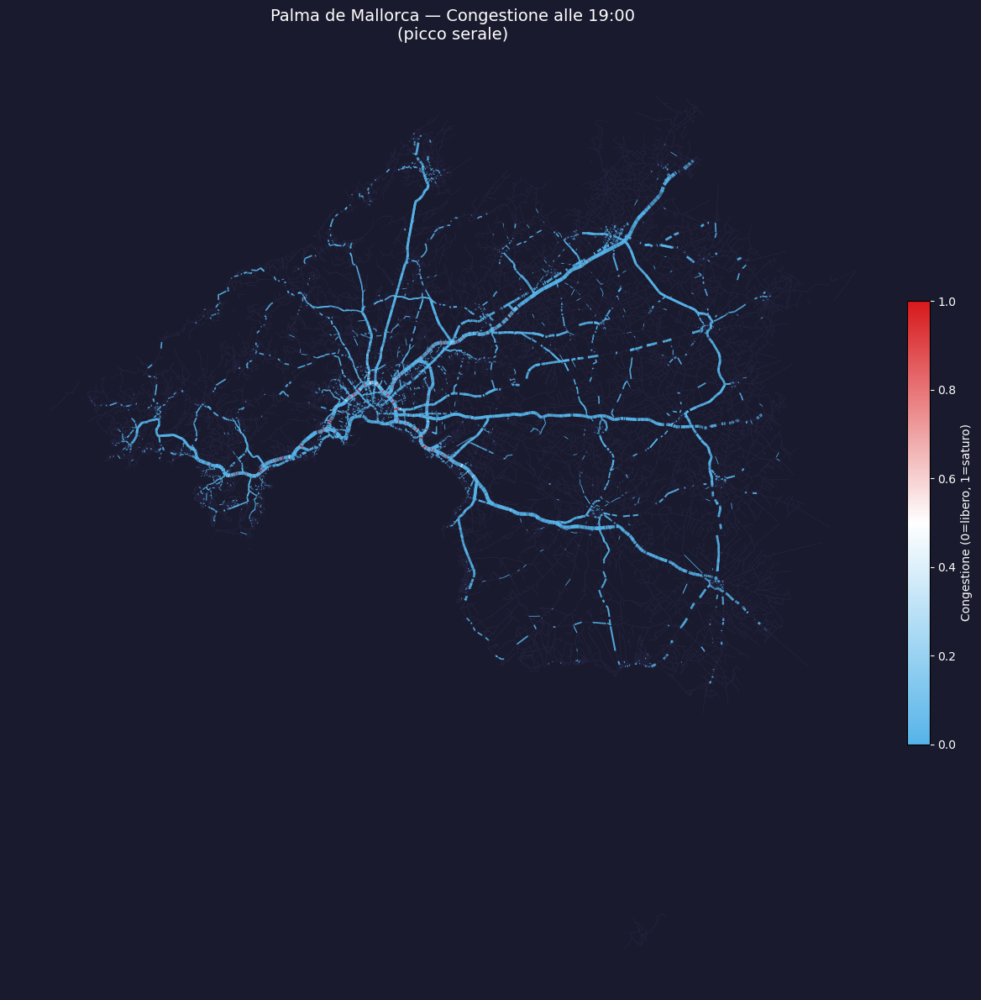

In [7]:
# Colormap azure → bianco → rosso (low → mid → high congestion)
CMAP = mcolors.LinearSegmentedColormap.from_list(
    'cong', ['#56b4e9', '#ffffff', '#d7191c'], N=256
)
BG = '#1a1a2e'

fig, ax = plt.subplots(figsize=(14, 12), facecolor=BG)
ax.set_facecolor(BG)

# Layer 1: rete di sfondo (grigio scuro, tutte le strade auto)
static_file = RESULTS_DIR / 'static_network.geojson'
if static_file.exists():
    with open(static_file) as f:
        static_data = json.load(f)
    car_feats = [x for x in static_data['features']
                 if x.get('geometry') and x['properties']['road_class'] <= 14]
    static_gdf = gpd.GeoDataFrame(
        [x['properties'] for x in car_feats],
        geometry=[shape(x['geometry']) for x in car_feats],
        crs='EPSG:4326'
    )
    static_gdf.plot(ax=ax, color='#2a2a4a', linewidth=0.3, alpha=0.6)

# Layer 2: archi attivi colorati per congestione
# Ordina per congestione (bassi sotto, alti sopra)
peak_gdf_sorted = peak_gdf.sort_values('congestion')
lw_map = {0:3.0, 1:2.5, 2:2.5, 3:2.0, 4:2.0, 5:1.5,
           6:1.5, 7:1.2, 8:1.2, 9:1.0, 10:0.8, 11:0.8,
           12:0.6, 13:0.6, 14:0.4}
peak_gdf_sorted['lw'] = peak_gdf_sorted['road_class'].map(lw_map).fillna(0.5)
peak_gdf_sorted.plot(
    ax=ax, column='congestion', cmap=CMAP,
    linewidth=peak_gdf_sorted['lw'],
    vmin=0, vmax=1, alpha=0.9
)

# Colorbar
sm = cm.ScalarMappable(cmap=CMAP, norm=mcolors.Normalize(vmin=0, vmax=1))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.01)
cbar.set_label('Congestione (0=libero, 1=saturo)', color='white', fontsize=10)
cbar.ax.yaxis.set_tick_params(color='white')
plt.setp(cbar.ax.yaxis.get_ticklabels(), color='white')

ax.set_title('Palma de Mallorca — Congestione alle 19:00\n(picco serale)',
             color='white', fontsize=14, pad=12)
ax.axis('off')
plt.tight_layout()

out = RESULTS_DIR / 'congestion_peak_19h.png'
fig.savefig(out, dpi=150, bbox_inches='tight', facecolor=BG)
print(f'Salvato: {out}')
plt.show()

## 3. Mappa interattiva — CartoDB dark + gradiente congestione

In [8]:
try:
    import folium
except ImportError:
    raise SystemExit('folium non installato: pip install folium')

def cong_to_hex(v):
    """Azure (#56b4e9) → white → red (#d7191c)"""
    rgba = CMAP(float(np.clip(v, 0, 1)))
    return mcolors.to_hex(rgba)

# Usa solo strade ≤ Tertiary per non bloccare il browser (+ filtro: archi attivi)
MAJOR = list(range(10))
peak_major = peak_gdf[peak_gdf['road_class'].isin(MAJOR)].copy()
peak_major['color_hex'] = peak_major['congestion'].apply(cong_to_hex)

lw_folium = {0:6,1:5,2:5,3:4,4:3.5,5:3,6:2.5,7:2,8:1.5,9:1.2}
peak_major['lw'] = peak_major['road_class'].map(lw_folium).fillna(1.5)

center = [peak_gdf.geometry.centroid.y.mean(), peak_gdf.geometry.centroid.x.mean()]
m = folium.Map(location=center, zoom_start=12,
               tiles='CartoDB dark_matter')

# Due layer: libero (cong < 0.3) e congestionato (≥ 0.3)
grp_free = folium.FeatureGroup(name='Libero (cong < 0.3)', show=True)
grp_cong = folium.FeatureGroup(name='Congestionato (cong ≥ 0.3)', show=True)

for _, row in peak_major.iterrows():
    coords = list(row.geometry.coords)
    popup_text = (f"Edge {row['edge_id']} · {ROAD_CLASS.get(row['road_class'], '?')}<br>"
                  f"Congestione: {row['congestion']:.2f}<br>"
                  f"Flusso: {row['flow_veh_h']:.0f} veh/h<br>"
                  f"Capacità: {row['capacity_veh_h']:.0f} veh/h")
    line = folium.PolyLine(
        locations=[(lat, lon) for lon, lat in coords],
        color=row['color_hex'],
        weight=row['lw'],
        opacity=0.85,
        tooltip=popup_text,
    )
    if row['congestion'] >= 0.3:
        line.add_to(grp_cong)
    else:
        line.add_to(grp_free)

grp_free.add_to(m)
grp_cong.add_to(m)

# Legenda colorbar HTML inline
legend_html = '''
<div style="position:fixed; bottom:30px; left:30px; z-index:9999;
            background:#1a1a2eee; padding:12px 16px; border-radius:8px;
            color:white; font-family:Arial; font-size:12px;">
  <b>Congestione 19:00</b><br><br>
  <span style="background:linear-gradient(to right,#56b4e9,#ffffff,#d7191c);
               display:inline-block;width:140px;height:12px;
               border-radius:3px;"></span><br>
  <span style="float:left">0 (libero)</span>
  <span style="float:right">1 (saturo)</span>
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))
folium.LayerControl().add_to(m)

print(f'Archi disegnati: {len(peak_major):,}')
m.save(RESULTS_DIR / 'congestion_peak.html')

/tmp/ipykernel_36906/3326557315.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = [peak_gdf.geometry.centroid.y.mean(), peak_gdf.geometry.centroid.x.mean()]


Archi disegnati: 11,333


## 4. Confronto tra orari — mattina (08:00) vs picco sera (19:00)

/tmp/ipykernel_36906/125970966.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Salvato: /home/fede/code/nomad/results/palma_de_mallorca/2022-02-08_00-00_23-59/congestion_compare_4h.png


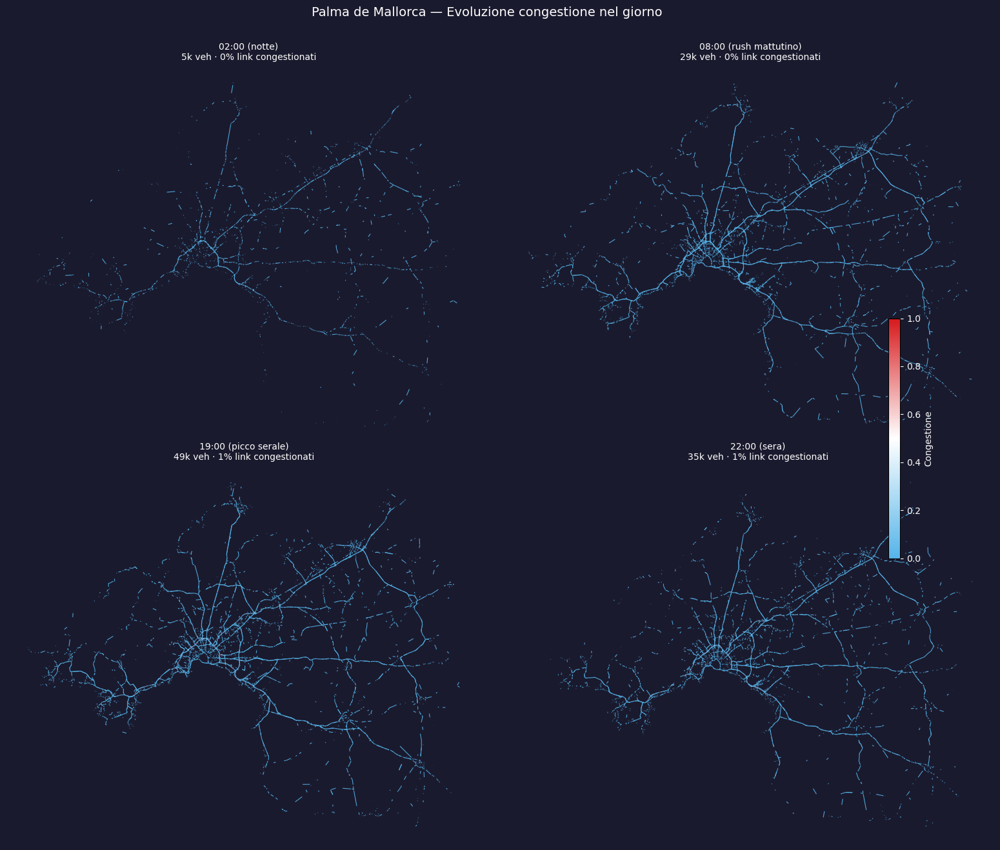

In [9]:
HOURS_TO_COMPARE = [
    ( 7200, '02:00 (notte)'),
    (28800, '08:00 (rush mattutino)'),
    (68400, '19:00 (picco serale)'),
    (79200, '22:00 (sera)'),
]

fig, axes = plt.subplots(2, 2, figsize=(16, 13), facecolor='#1a1a2e')
BG = '#1a1a2e'

for ax, (ts, label) in zip(axes.flat, HOURS_TO_COMPARE):
    ax.set_facecolor(BG)
    ax.axis('off')
    fname = RESULTS_DIR / f'network_state_{ts:06d}.geojson'
    if not fname.exists():
        ax.set_title(f'{label}\n(snapshot non trovato)', color='white')
        continue
    with open(fname) as f:
        d = json.load(f)
    feats = [x for x in d['features'] if x.get('geometry')]
    gdf = gpd.GeoDataFrame(
        [x['properties'] for x in feats],
        geometry=[shape(x['geometry']) for x in feats],
        crs='EPSG:4326'
    )
    gdf_sorted = gdf.sort_values('congestion')
    gdf_sorted.plot(ax=ax, column='congestion', cmap=CMAP,
                    linewidth=0.8, vmin=0, vmax=1, alpha=0.9)
    n_veh = gdf['count'].sum()
    pct_cong = (gdf['congestion'] >= 0.5).mean() * 100
    ax.set_title(f'{label}\n{n_veh/1000:.0f}k veh · {pct_cong:.0f}% link congestionati',
                 color='white', fontsize=10, pad=6)

sm = cm.ScalarMappable(cmap=CMAP, norm=mcolors.Normalize(vmin=0, vmax=1))
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, fraction=0.015, pad=0.02)
cbar.set_label('Congestione', color='white')
plt.setp(cbar.ax.yaxis.get_ticklabels(), color='white')
cbar.ax.yaxis.set_tick_params(color='white')

fig.suptitle('Palma de Mallorca — Evoluzione congestione nel giorno',
             color='white', fontsize=14, y=1.01)
plt.tight_layout()

out = RESULTS_DIR / 'congestion_compare_4h.png'
fig.savefig(out, dpi=150, bbox_inches='tight', facecolor=BG)
print(f'Salvato: {out}')
plt.show()

## 5. Analisi OD — domanda di trasporto

## 5b. Agenti bloccati a fine giornata — per road class e ora di partenza

Ultimo snapshot: t=85500s (23.8h) — network_state_085500.geojson

Archi con veicoli a fine giornata: 9,290
Veicoli totali rimasti: 22,260

Veicoli bloccati per road class:
road_class
Motorway         10738
Primary           2881
Trunk             2707
Tertiary          2038
Residential       1251
MotorwayLink      1110
Secondary          745
Unclassified       265
Service            204
TrunkLink          176
PrimaryLink         85
TertiaryLink        49
SecondaryLink        6
LivingStreet         5


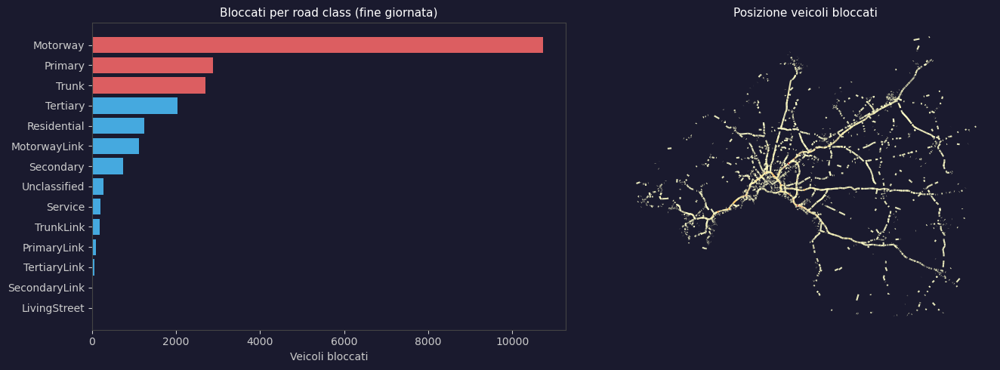

In [10]:
# Snapshot a fine giornata (ultimo disponibile) per identificare dove restano gli agenti
last_snap = sorted(RESULTS_DIR.glob('network_state_*.geojson'))[-1]
ts_last = int(last_snap.stem.replace('network_state_', ''))
print(f'Ultimo snapshot: t={ts_last}s ({ts_last/3600:.1f}h) — {last_snap.name}')

with open(last_snap) as f:
    last_data = json.load(f)

feats_last = [x for x in last_data['features'] if x.get('geometry') and x['properties']['count'] > 0]
last_gdf = gpd.GeoDataFrame(
    [x['properties'] for x in feats_last],
    geometry=[shape(x['geometry']) for x in feats_last],
    crs='EPSG:4326'
)

print(f'\nArchi con veicoli a fine giornata: {len(last_gdf):,}')
print(f'Veicoli totali rimasti: {last_gdf["count"].sum():,}')
print()

# Per road class
by_class = (last_gdf.groupby('road_class')['count']
            .sum()
            .rename(index=ROAD_CLASS)
            .sort_values(ascending=False))
print('Veicoli bloccati per road class:')
print(by_class.to_string())

# Grafico
BG = '#1a1a2e'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5), facecolor=BG)
for ax in (ax1, ax2):
    ax.set_facecolor(BG)
    ax.tick_params(colors='#cccccc')
    ax.spines[:].set_color('#444444')

# Bar plot road class
colors_bar = ['#ff6b6b' if v > by_class.max()*0.2 else '#4dc3ff' for v in by_class.values]
ax1.barh(by_class.index, by_class.values, color=colors_bar, alpha=0.85)
ax1.set_xlabel('Veicoli bloccati', color='#cccccc')
ax1.set_title('Bloccati per road class (fine giornata)', color='white', fontsize=11)
ax1.invert_yaxis()

# Mappa spaziale degli archi con veicoli bloccati
last_gdf_sorted = last_gdf.sort_values('count')
last_gdf_sorted.plot(
    ax=ax2, column='count', cmap='YlOrRd',
    linewidth=1.5, alpha=0.9, legend=False
)
ax2.set_facecolor('#0d0d1a')
ax2.set_title('Posizione veicoli bloccati', color='white', fontsize=11)
ax2.axis('off')

plt.tight_layout()
plt.show()

Righe OD : 588,903
Agenti   : 1,922,506

Mode split:
mode
bike        4.3
car        37.1
transit    28.8
walk       29.8



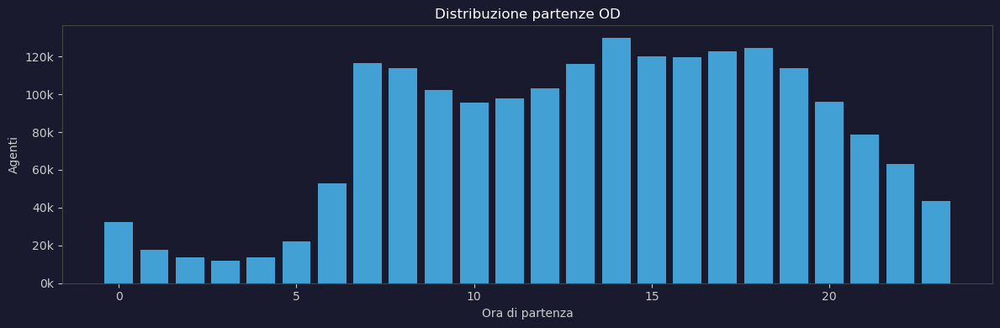

In [11]:
od_path = DATA_DIR / 'od_palma_de_mallorca_weekday.csv'
if not od_path.exists():
    print(f'OD non trovata: {od_path}')
else:
    od = pd.read_csv(od_path)
    print(f'Righe OD : {len(od):,}')
    print(f'Agenti   : {od["count"].sum():,}')
    print()
    print('Mode split:')
    ms = od.groupby('mode')['count'].sum()
    print((ms / ms.sum() * 100).round(1).rename('% agenti').to_string())
    print()

    od['hour'] = (od['depart_mean_s'] / 3600).astype(int)
    hourly = od.groupby('hour')['count'].sum()

    fig, ax = plt.subplots(figsize=(12, 4), facecolor='#1a1a2e')
    ax.set_facecolor('#1a1a2e')
    ax.bar(hourly.index, hourly.values, color='#4dc3ff', alpha=0.8, width=0.8)
    ax.set_xlabel('Ora di partenza', color='#cccccc')
    ax.set_ylabel('Agenti', color='#cccccc')
    ax.set_title('Distribuzione partenze OD', color='white', fontsize=12)
    ax.tick_params(colors='#cccccc')
    ax.spines[:].set_color('#444444')
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x/1e3:.0f}k'))
    plt.tight_layout()
    plt.show()

## 6. Mappa flusso veicolare (flow_veh_h) — 19:00

In [12]:
try:
    import folium
except ImportError:
    raise SystemExit('folium non installato')

FLOW_CMAP = mcolors.LinearSegmentedColormap.from_list(
    'flow', ['#1a1a2e', '#2196f3', '#00e5ff', '#ffeb3b', '#ff5722'], N=256
)

max_flow = peak_major['flow_veh_h'].quantile(0.99)

def flow_to_hex(v):
    rgba = FLOW_CMAP(float(np.clip(v / max_flow, 0, 1)))
    return mcolors.to_hex(rgba)

peak_major = peak_major.copy()
peak_major['flow_color'] = peak_major['flow_veh_h'].apply(flow_to_hex)

m2 = folium.Map(location=center, zoom_start=12, tiles='CartoDB dark_matter')

for _, row in peak_major.sort_values('flow_veh_h').iterrows():
    coords = list(row.geometry.coords)
    popup_text = (f"Edge {row['edge_id']} · {ROAD_CLASS.get(row['road_class'], '?')}<br>"
                  f"Flusso: {row['flow_veh_h']:.0f} veh/h<br>"
                  f"Densità: {row['density_veh_km']:.1f} veh/km")
    folium.PolyLine(
        locations=[(lat, lon) for lon, lat in coords],
        color=row['flow_color'],
        weight=row['lw'],
        opacity=0.85,
        tooltip=popup_text,
    ).add_to(m2)

legend2_html = f'''
<div style="position:fixed; bottom:30px; left:30px; z-index:9999;
            background:#1a1a2eee; padding:12px 16px; border-radius:8px;
            color:white; font-family:Arial; font-size:12px;">
  <b>Flusso veicolare 19:00</b><br><br>
  <span style="background:linear-gradient(to right,#2196f3,#00e5ff,#ffeb3b,#ff5722);
               display:inline-block;width:140px;height:12px;
               border-radius:3px;"></span><br>
  <span style="float:left">0</span>
  <span style="float:right">{max_flow:.0f} veh/h</span>
</div>
'''
m2.get_root().html.add_child(folium.Element(legend2_html))

print(f'Archi disegnati: {len(peak_major):,}  (p99 flusso: {max_flow:.0f} veh/h)')
m2

Archi disegnati: 11,333  (p99 flusso: 8000 veh/h)
